In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import os
os.chdir('/Users/Eduardo/Desktop')

data= pd.read_excel('Proyecto final.xlsx')
data

,año,mes,Id_suc,Formato,VentaTotal,VentaOftálmico,VentaSolar,VentaLenteContacto,VentaOtros
0,2022,enero,1,E,71.305556,20.118152,16.516133,17.481249,17.190022
1,2022,enero,2,E,67.368188,19.206343,15.918669,16.516939,15.726238
2,2022,enero,3,C,72.135696,20.328936,16.310698,17.666658,17.829404
3,2022,enero,4,E,68.558990,19.237474,16.337713,16.874546,16.109257
4,2022,enero,5,E,66.418809,18.922135,14.614368,16.878948,16.003358
...,...,...,...,...,...,...,...,...,...
14826,2024,diciembre,439,D,68.146845,19.217157,17.196555,15.265427,16.467705
14827,2024,diciembre,440,D,65.352697,18.405443,16.800714,14.900764,15.245776
14828,2024,diciembre,441,D,64.215828,18.409832,15.063709,15.848500,14.893787
14829,2024,diciembre,442,D,67.535141,18.503624,16.462632,16.378802,16.190082


In [2]:
data.columns

Index(['año', 'mes', 'Id_suc', 'Formato', 'VentaTotal', 'VentaOftálmico',
       'VentaSolar', 'VentaLenteContacto', 'VentaOtros'],
      dtype='object')

In [3]:
#Checar si hay datos nulos y tipo de datos
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14831 entries, 0 to 14830
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   año                 14831 non-null  int64  
 1   mes                 14831 non-null  object 
 2   Id_suc              14831 non-null  int64  
 3   Formato             14831 non-null  object 
 4   VentaTotal          14831 non-null  float64
 5   VentaOftálmico      14831 non-null  float64
 6   VentaSolar          14831 non-null  float64
 7   VentaLenteContacto  14831 non-null  float64
 8   VentaOtros          14831 non-null  float64
dtypes: float64(5), int64(2), object(2)
memory usage: 1.0+ MB


In [4]:
#Estadistica general
data.describe(include='all')

,año,mes,Id_suc,Formato,VentaTotal,VentaOftálmico,VentaSolar,VentaLenteContacto,VentaOtros
count,14831.000000,14831,14831.000000,14831,14831.000000,14831.000000,14831.000000,14831.000000,14831.000000
unique,NaN,12,NaN,7,NaN,NaN,NaN,NaN,NaN
top,NaN,diciembre,NaN,E,NaN,NaN,NaN,NaN,NaN
freq,NaN,1268,NaN,4504,NaN,NaN,NaN,NaN,NaN
mean,2023.022520,NaN,216.318859,NaN,66.916598,18.769380,15.753690,16.282794,16.110734
std,0.817974,NaN,130.607201,NaN,4.938423,1.229844,1.964887,1.756997,1.224062
min,2022.000000,NaN,1.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2022.000000,NaN,103.500000,NaN,65.675955,18.405615,15.382110,15.968477,15.727938
50%,2023.000000,NaN,207.000000,NaN,67.344856,18.813608,16.005623,16.498106,16.192901
75%,2024.000000,NaN,339.000000,NaN,69.099540,19.258607,16.576035,16.950470,16.653830


In [5]:
#Datos unicos
data.nunique()

año                       3
mes                      12
Id_suc                  443
Formato                   7
VentaTotal            14811
VentaOftálmico        14738
VentaSolar            13325
VentaLenteContacto    14011
VentaOtros            14233
dtype: int64

<Axes: >

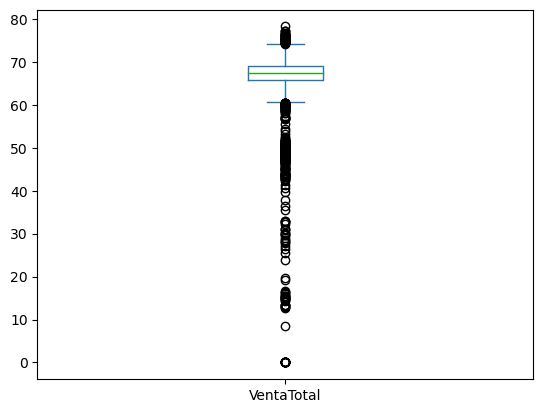

In [6]:
#Deteccion de outliers
data["VentaTotal"].plot(kind='box')  # outliers visibles

In [7]:
# Contar duplicados exactos(identificar si hay duplicados)
duplicados = data.duplicated().sum()
print(f"Filas duplicadas exactas: {duplicados}")

Filas duplicadas exactas: 0


In [8]:
# Si hay duplicados, eliminarlos
data = data.drop_duplicates()

In [9]:
#Cambiar los meses a numero para poderlos convertir a formato 'fecha'
meses = {
    'enero': 1,
    'febrero': 2,
    'marzo': 3,
    'abril': 4,
    'mayo': 5,
    'junio': 6,
    'julio': 7,
    'agosto': 8,
    'septiembre': 9,
    'octubre': 10,
    'noviembre': 11,
    'diciembre': 12
}

data['mes_num'] = data['mes'].str.lower().map(meses)
data['fecha'] = pd.to_datetime(data['año'].astype(str) + '-' + data['mes_num'].astype(str) + '-01')


In [10]:
data

,año,mes,Id_suc,Formato,VentaTotal,VentaOftálmico,VentaSolar,VentaLenteContacto,VentaOtros,mes_num,fecha
0,2022,enero,1,E,71.305556,20.118152,16.516133,17.481249,17.190022,1,2022-01-01
1,2022,enero,2,E,67.368188,19.206343,15.918669,16.516939,15.726238,1,2022-01-01
2,2022,enero,3,C,72.135696,20.328936,16.310698,17.666658,17.829404,1,2022-01-01
3,2022,enero,4,E,68.558990,19.237474,16.337713,16.874546,16.109257,1,2022-01-01
4,2022,enero,5,E,66.418809,18.922135,14.614368,16.878948,16.003358,1,2022-01-01
...,...,...,...,...,...,...,...,...,...,...,...
14826,2024,diciembre,439,D,68.146845,19.217157,17.196555,15.265427,16.467705,12,2024-12-01
14827,2024,diciembre,440,D,65.352697,18.405443,16.800714,14.900764,15.245776,12,2024-12-01
14828,2024,diciembre,441,D,64.215828,18.409832,15.063709,15.848500,14.893787,12,2024-12-01
14829,2024,diciembre,442,D,67.535141,18.503624,16.462632,16.378802,16.190082,12,2024-12-01


In [11]:
#Verificacion de valores nulos
valores_nulos = data.isnull().sum()
print(valores_nulos)

año                   0
mes                   0
Id_suc                0
Formato               0
VentaTotal            0
VentaOftálmico        0
VentaSolar            0
VentaLenteContacto    0
VentaOtros            0
mes_num               0
fecha                 0
dtype: int64


  0%|                                                                                         | 0/1677 [00:00<…

DataPrep Report
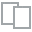
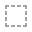
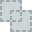
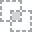
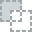
...
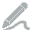
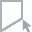
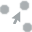
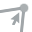
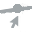

In [12]:
# Análisis Exploratorio
from dataprep.eda import create_report

create_report(data)

In [13]:
data['VentaTotal'].skew()

-6.940066744367571

In [14]:
# Crear tabla de descuentos manual(descuentos ficticios)
tabla_descuentos = pd.DataFrame({
    'mes': ['enero','febrero','marzo','abril','mayo','junio',
            'julio','agosto','septiembre','octubre','noviembre','diciembre'],
    'Descuento_Oftálmico': [0.05,0.03,0.04,0.06,0.05,0.02,0.03,0.05,0.04,0.05,0.07,0.1],
    'Descuento_Solar': [0.1,0.07,0.08,0.05,0.06,0.02,0.05,0.08,0.06,0.07,0.12,0.15],
    'Descuento_LenteContacto': [0.08,0.06,0.05,0.07,0.06,0.04,0.05,0.07,0.05,0.06,0.08,0.1],
    'Descuento_Otros': [0.03,0.02,0.03,0.04,0.03,0.01,0.02,0.03,0.03,0.03,0.04,0.05]
})

# Unir con el dataset principal
data = data.merge(tabla_descuentos, on='mes', how='left')
data

,año,mes,Id_suc,Formato,VentaTotal,VentaOftálmico,VentaSolar,VentaLenteContacto,VentaOtros,mes_num,fecha,Descuento_Oftálmico,Descuento_Solar,Descuento_LenteContacto,Descuento_Otros
0,2022,enero,1,E,71.305556,20.118152,16.516133,17.481249,17.190022,1,2022-01-01,0.05,0.10,0.08,0.03
1,2022,enero,2,E,67.368188,19.206343,15.918669,16.516939,15.726238,1,2022-01-01,0.05,0.10,0.08,0.03
2,2022,enero,3,C,72.135696,20.328936,16.310698,17.666658,17.829404,1,2022-01-01,0.05,0.10,0.08,0.03
3,2022,enero,4,E,68.558990,19.237474,16.337713,16.874546,16.109257,1,2022-01-01,0.05,0.10,0.08,0.03
4,2022,enero,5,E,66.418809,18.922135,14.614368,16.878948,16.003358,1,2022-01-01,0.05,0.10,0.08,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14826,2024,diciembre,439,D,68.146845,19.217157,17.196555,15.265427,16.467705,12,2024-12-01,0.10,0.15,0.10,0.05
14827,2024,diciembre,440,D,65.352697,18.405443,16.800714,14.900764,15.245776,12,2024-12-01,0.10,0.15,0.10,0.05
14828,2024,diciembre,441,D,64.215828,18.409832,15.063709,15.848500,14.893787,12,2024-12-01,0.10,0.15,0.10,0.05
14829,2024,diciembre,442,D,67.535141,18.503624,16.462632,16.378802,16.190082,12,2024-12-01,0.10,0.15,0.10,0.05


## Dado que no se proporcionaron datos reales de descuentos, se construyó una tabla con porcentajes estimados promedio por mes para fines de enriquecimiento de datos y modelado.

In [15]:
# Agrupar por año y mes
ventas_por_mes = data.groupby(['año','mes'], sort=False)['VentaTotal'].sum().reset_index()

# Ordenar los meses en orden cronológico (enero, febrero, ...)
orden_meses = ['enero','febrero','marzo','abril','mayo','junio','julio',
               'agosto','septiembre','octubre','noviembre','diciembre']

ventas_por_mes['mes'] = pd.Categorical(ventas_por_mes['mes'], categories=orden_meses, ordered=True)
ventas_por_mes = ventas_por_mes.sort_values(['año','mes'])

ventas_por_mes


,año,mes,VentaTotal
0,2022,enero,26603.109229
1,2022,febrero,26418.885106
2,2022,marzo,26681.016680
3,2022,abril,26584.717319
4,2022,mayo,26756.824373
5,2022,junio,26437.566769
6,2022,julio,26745.814197
7,2022,agosto,26584.185497
8,2022,septiembre,26231.340242
9,2022,octubre,26616.269511


In [16]:
ventas_por_formato = data.groupby(['Formato'])['VentaTotal'].sum().reset_index()
ventas_por_formato

,Formato,VentaTotal
0,A,109782.027854
1,B,4307.243272
2,C,156425.408900
3,D,205051.416955
4,E,306139.549916
5,F,209070.913591
6,G,1663.502781


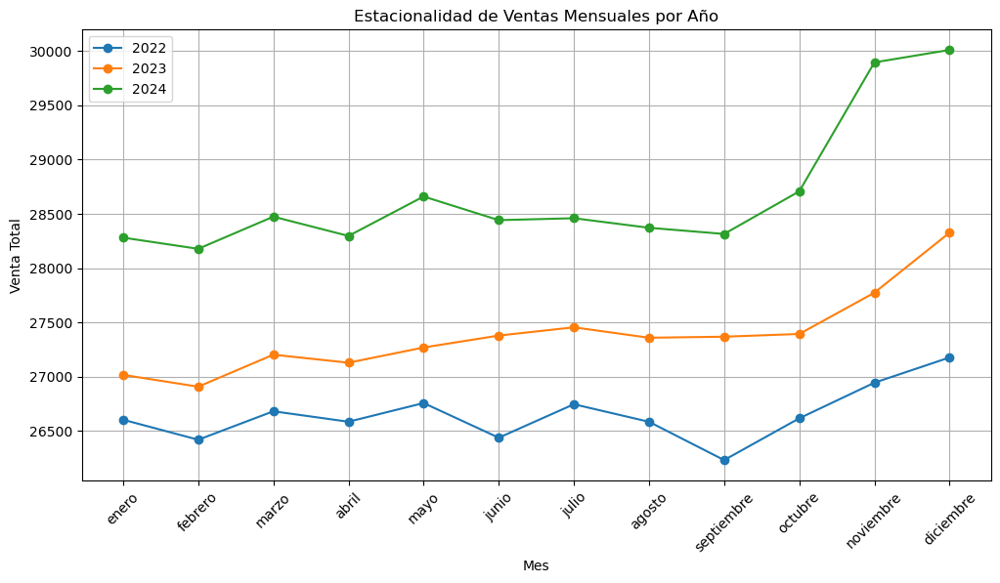

In [17]:
import matplotlib.pyplot as plt

# Crear un gráfico de línea de ventas mensuales por año
plt.figure(figsize=(12,6))
for año in ventas_por_mes['año'].unique():
    data_año = ventas_por_mes[ventas_por_mes['año'] == año]
    plt.plot(data_año['mes'], data_año['VentaTotal'], marker='o', label=str(año))

plt.title('Estacionalidad de Ventas Mensuales por Año')
plt.xlabel('Mes')
plt.ylabel('Venta Total')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


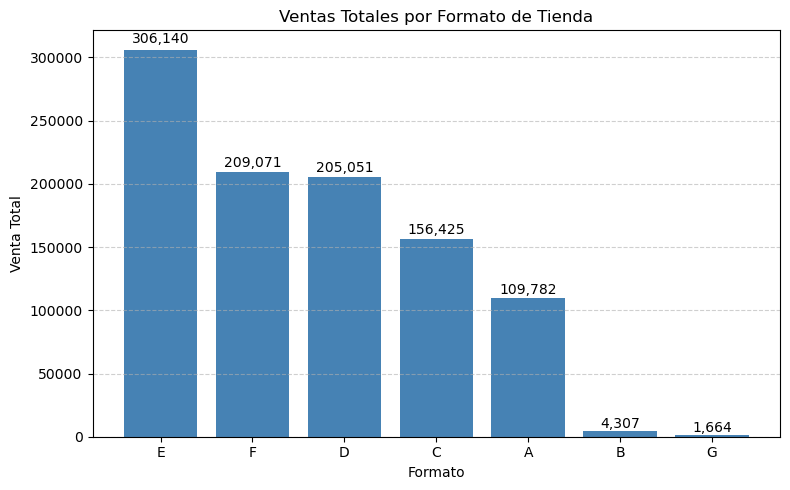

In [19]:
#Ventas totales por formato de tienda
import matplotlib.pyplot as plt
import pandas as pd

# 🔸 Agrupar por formato de tienda
ventas_por_formato = data.groupby('Formato')['VentaTotal'].sum().reset_index()

# 🔸 Ordenar de mayor a menor venta
ventas_por_formato = ventas_por_formato.sort_values(by='VentaTotal', ascending=False)

# 🔸 Graficar barras
plt.figure(figsize=(8,5))
plt.bar(ventas_por_formato['Formato'], ventas_por_formato['VentaTotal'], color='steelblue')

plt.title('Ventas Totales por Formato de Tienda')
plt.xlabel('Formato')
plt.ylabel('Venta Total')
plt.grid(axis='y', linestyle='--', alpha=0.6)

# 🔸 Agregar etiquetas encima de las barras
for i, v in enumerate(ventas_por_formato['VentaTotal']):
    plt.text(i, v + (v*0.01), f'{v:,.0f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


In [20]:
# Deteccion de outliers
# Agrupar por sucursal
ventas_por_sucursal = data.groupby('Id_suc')['VentaTotal'].mean().reset_index()

ventas_por_sucursal.rename(columns={'VentaTotal':'VentaPromedio'}, inplace=True)
ventas_por_sucursal.sort_values(by='VentaPromedio', ascending=False).head()
ventas_por_sucursal

,Id_suc,VentaPromedio
0,1,71.374802
1,2,68.201647
2,3,72.982762
3,4,67.950566
4,5,66.593076
...,...,...
438,439,66.355550
439,440,63.476830
440,441,62.134076
441,442,66.742443


In [21]:
Q1 = ventas_por_sucursal['VentaPromedio'].quantile(0.25)
Q3 = ventas_por_sucursal['VentaPromedio'].quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

outliers_bajos = ventas_por_sucursal[ventas_por_sucursal['VentaPromedio'] < limite_inferior]
outliers_altos = ventas_por_sucursal[ventas_por_sucursal['VentaPromedio'] > limite_superior]


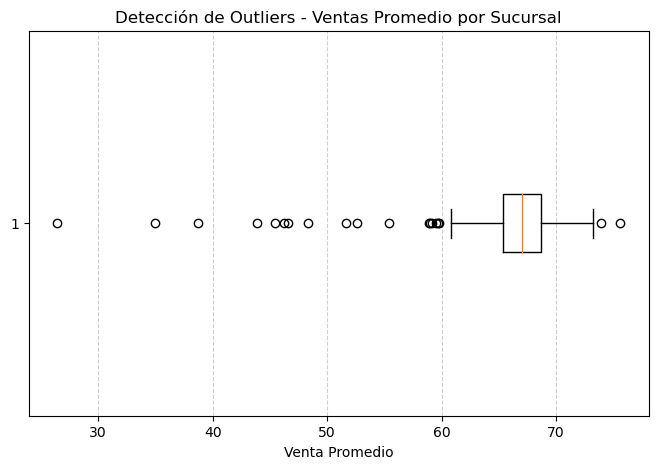

In [22]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.boxplot(ventas_por_sucursal['VentaPromedio'], vert=False)
plt.title('Detección de Outliers - Ventas Promedio por Sucursal')
plt.xlabel('Venta Promedio')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()


In [23]:
# Medir correlacion entre variables
# Seleccionar solo las columnas numéricas relevantes
cols_numericas = ['VentaTotal','VentaOftálmico','VentaSolar',
                  'VentaLenteContacto','VentaOtros',
                  'Descuento_Oftálmico','Descuento_Solar',
                  'Descuento_LenteContacto','Descuento_Otros']

# Matriz de correlación
corr_matrix = data[cols_numericas].corr()

# Mostrar matriz
print(corr_matrix)


                         VentaTotal  VentaOftálmico  VentaSolar  \
VentaTotal                 1.000000        0.835137    0.768907   
VentaOftálmico             0.835137        1.000000    0.499828   
VentaSolar                 0.768907        0.499828    1.000000   
VentaLenteContacto         0.771072        0.538064    0.341267   
VentaOtros                 0.854327        0.789937    0.504865   
Descuento_Oftálmico        0.039915        0.035395    0.028108   
Descuento_Solar            0.041897        0.047219    0.016674   
Descuento_LenteContacto    0.037561        0.043207    0.017629   
Descuento_Otros            0.032794        0.029200    0.021621   

                         VentaLenteContacto  VentaOtros  Descuento_Oftálmico  \
VentaTotal                         0.771072    0.854327             0.039915   
VentaOftálmico                     0.538064    0.789937             0.035395   
VentaSolar                         0.341267    0.504865             0.028108   
VentaLent

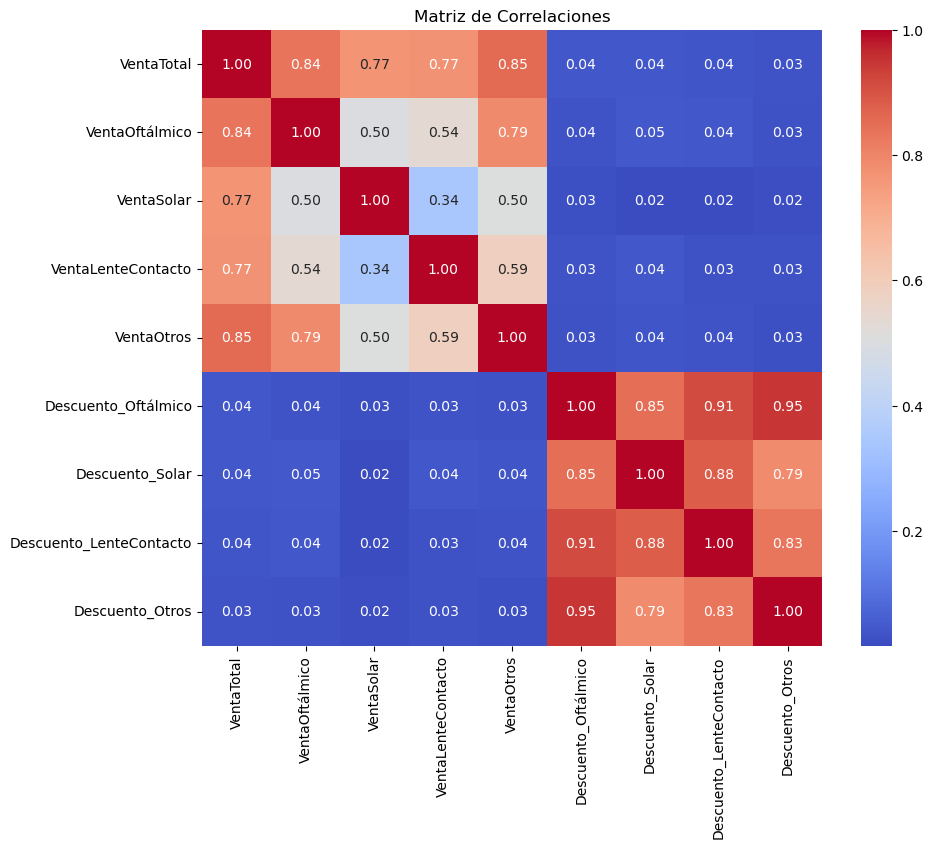

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlaciones')
plt.show()


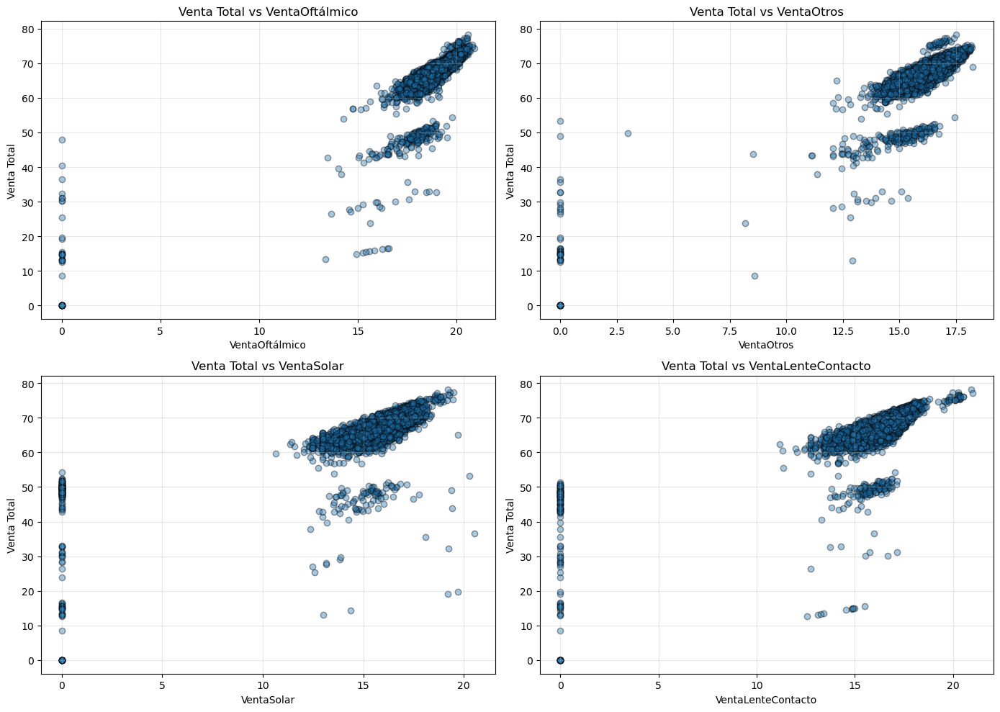

In [26]:
import matplotlib.pyplot as plt

# Lista de variables con alta correlación
variables = ['VentaOftálmico', 'VentaOtros', 'VentaSolar', 'VentaLenteContacto']

plt.figure(figsize=(14,10))

for i, var in enumerate(variables):
    plt.subplot(2, 2, i+1)
    plt.scatter(data[var], data['VentaTotal'], alpha=0.4, edgecolors='k')
    plt.title(f'Venta Total vs {var}')
    plt.xlabel(var)
    plt.ylabel('Venta Total')
    plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [28]:
# Correlaciones mas fuertes 
# Seleccionar columnas numéricas relevantes
cols = ['VentaOftálmico', 'VentaSolar', 'VentaLenteContacto', 'VentaOtros',
        'Descuento_Oftálmico', 'Descuento_Solar', 'Descuento_LenteContacto', 'Descuento_Otros']

# Calcular correlación con VentaTotal
correlaciones = data[cols].corrwith(data['VentaTotal']).sort_values(ascending=False)

# Mostrar ordenado
print(correlaciones)


VentaOtros                 0.854327
VentaOftálmico             0.835137
VentaLenteContacto         0.771072
VentaSolar                 0.768907
Descuento_Solar            0.041897
Descuento_Oftálmico        0.039915
Descuento_LenteContacto    0.037561
Descuento_Otros            0.032794
dtype: float64


In [32]:
data.to_excel('C:/Users/Eduardo/Desktop/datos_limpios.xlsx', index=False)

In [33]:
data

,año,mes,Id_suc,Formato,VentaTotal,VentaOftálmico,VentaSolar,VentaLenteContacto,VentaOtros,mes_num,fecha,Descuento_Oftálmico,Descuento_Solar,Descuento_LenteContacto,Descuento_Otros
0,2022,enero,1,E,71.305556,20.118152,16.516133,17.481249,17.190022,1,2022-01-01,0.05,0.10,0.08,0.03
1,2022,enero,2,E,67.368188,19.206343,15.918669,16.516939,15.726238,1,2022-01-01,0.05,0.10,0.08,0.03
2,2022,enero,3,C,72.135696,20.328936,16.310698,17.666658,17.829404,1,2022-01-01,0.05,0.10,0.08,0.03
3,2022,enero,4,E,68.558990,19.237474,16.337713,16.874546,16.109257,1,2022-01-01,0.05,0.10,0.08,0.03
4,2022,enero,5,E,66.418809,18.922135,14.614368,16.878948,16.003358,1,2022-01-01,0.05,0.10,0.08,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14826,2024,diciembre,439,D,68.146845,19.217157,17.196555,15.265427,16.467705,12,2024-12-01,0.10,0.15,0.10,0.05
14827,2024,diciembre,440,D,65.352697,18.405443,16.800714,14.900764,15.245776,12,2024-12-01,0.10,0.15,0.10,0.05
14828,2024,diciembre,441,D,64.215828,18.409832,15.063709,15.848500,14.893787,12,2024-12-01,0.10,0.15,0.10,0.05
14829,2024,diciembre,442,D,67.535141,18.503624,16.462632,16.378802,16.190082,12,2024-12-01,0.10,0.15,0.10,0.05


In [35]:
y = data['VentaTotal']
y

0        71.305556
1        67.368188
2        72.135696
3        68.558990
4        66.418809
           ...    
14826    68.146845
14827    65.352697
14828    64.215828
14829    67.535141
14830    56.789914
Name: VentaTotal, Length: 14831, dtype: float64

In [36]:
# Convertimos a datetime por si acaso
data['fecha'] = pd.to_datetime(data['fecha'])

# Train: 2022 y 2023
train = data[data['fecha'] < '2024-01-01']

# Test: 2024
test = data[data['fecha'] >= '2024-01-01']


In [37]:
train.shape, test.shape


((9699, 15), (5132, 15))

In [38]:
X_train = train.drop(columns=['VentaTotal'])
y_train = train['VentaTotal']

X_test = test.drop(columns=['VentaTotal'])
y_test = test['VentaTotal']

In [54]:
import pandas as pd

# Copia de tu dataframe limpio
data = data.copy()   

# 1) Homogeneiza nombres de columnas
data.columns = [c.lower() for c in data.columns]

# 2) Crear columna fecha de forma segura
if 'fecha' in data.columns:
    data['fecha'] = pd.to_datetime(data['fecha'], errors='coerce')
elif all(col in data.columns for col in ['año', 'mes']):
    data['fecha'] = pd.to_datetime({
        'year': data['año'].astype(int),
        'month': data['mes'].astype(int),
        'day': 1
    })
else:
    raise ValueError("No encuentro columnas de fecha. Debe existir 'fecha' o 'año'+'mes'.")

# Ordena
data = data.sort_values('fecha')

# 3) Serie mensual total (ajusta nombre si no es ventatotal)
target_col = 'ventatotal'
ventas_mensuales = (
    data.groupby(pd.Grouper(key='fecha', freq='MS'))[target_col]
      .sum()
      .sort_index()
)

# Asegura frecuencia mensual y rellena meses faltantes
ventas_mensuales = ventas_mensuales.asfreq('MS').ffill()

ventas_mensuales


fecha
2022-01-01    26603.109229
2022-02-01    26418.885106
2022-03-01    26681.016680
2022-04-01    26584.717319
2022-05-01    26756.824373
2022-06-01    26437.566769
2022-07-01    26745.814197
2022-08-01    26584.185497
2022-09-01    26231.340242
2022-10-01    26616.269511
2022-11-01    26944.243316
2022-12-01    27176.522363
2023-01-01    27016.467604
2023-02-01    26907.358232
2023-03-01    27202.348727
2023-04-01    27128.363575
2023-05-01    27268.553406
2023-06-01    27378.372189
2023-07-01    27454.366676
2023-08-01    27358.300427
2023-09-01    27367.887440
2023-10-01    27393.097314
2023-11-01    27773.294888
2023-12-01    28326.220231
2024-01-01    28280.555763
2024-02-01    28177.429388
2024-03-01    28473.599162
2024-04-01    28296.248549
2024-05-01    28659.420828
2024-06-01    28441.509320
2024-07-01    28459.294358
2024-08-01    28371.326302
2024-09-01    28314.432800
2024-10-01    28706.964031
2024-11-01    29894.712835
2024-12-01    30009.444619
Freq: MS, Name: ventat

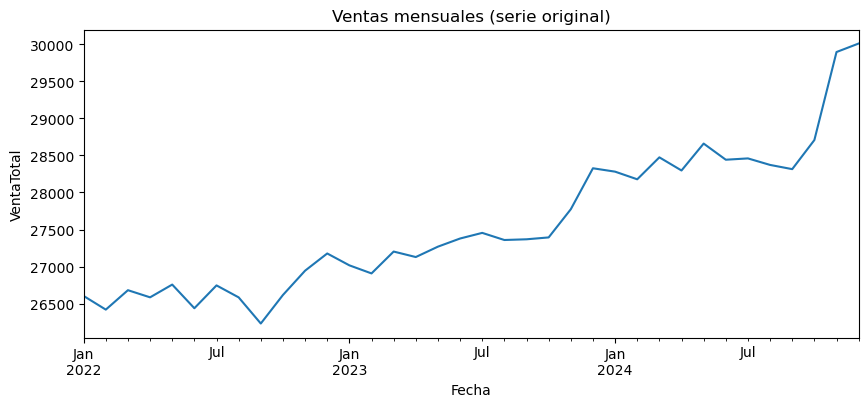

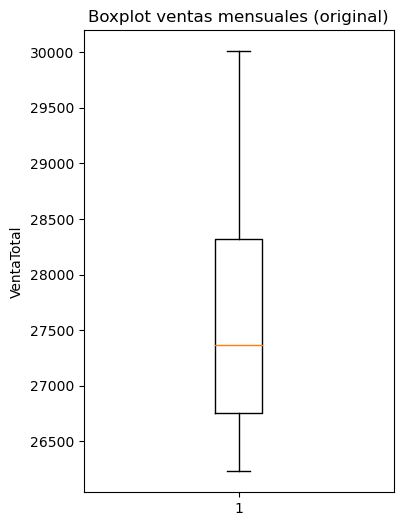

In [55]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
ventas_mensuales.plot()
plt.title('Ventas mensuales (serie original)')
plt.ylabel('VentaTotal')
plt.xlabel('Fecha')
plt.show()

plt.figure(figsize=(4,6))
plt.boxplot(ventas_mensuales.dropna(), vert=True)
plt.title('Boxplot ventas mensuales (original)')
plt.ylabel('VentaTotal')
plt.show()


In [90]:
#Crear el indice de fechas para 2025
import pandas as pd

fechas_2025 = pd.date_range(start='2025-01-01', end='2025-12-01', freq='MS')
fechas_2025

DatetimeIndex(['2025-01-01', '2025-02-01', '2025-03-01', '2025-04-01',
               '2025-05-01', '2025-06-01', '2025-07-01', '2025-08-01',
               '2025-09-01', '2025-10-01', '2025-11-01', '2025-12-01'],
              dtype='datetime64[ns]', freq='MS')

In [93]:
serie = ventas_mensuales.asfreq('MS')  # por si acaso, frecuencia mensual fija

train = serie[serie.index.year < 2024]   # 2022-2023
test  = serie[serie.index.year == 2024]  # 2024


In [94]:
#Modelo Holt winters
from statsmodels.tsa.holtwinters import ExponentialSmoothing

hw_model = ExponentialSmoothing(
    train,
    trend='add',
    seasonal='add',
    seasonal_periods=12
).fit()


In [95]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Predicción para 2024 (mismo horizonte que test)
pred_test = hw_model.forecast(len(test))

mae  = mean_absolute_error(test, pred_test)
rmse = np.sqrt(mean_squared_error(test, pred_test))
r2   = r2_score(test, pred_test)

print("MAE:", mae)
print("RMSE:", rmse)
print("R²:", r2)


MAE: 231.7651457264886
RMSE: 332.8441524116925
R²: 0.6819668019850391


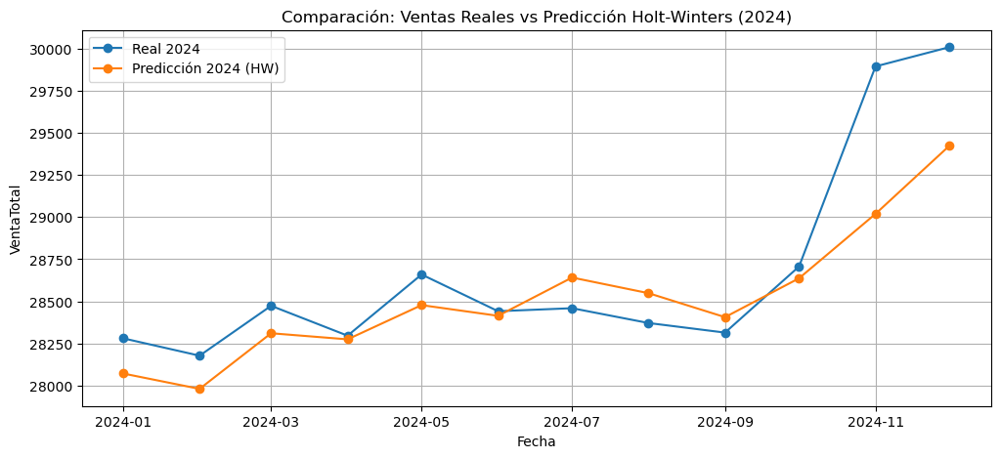

In [96]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
plt.plot(test.index, test.values, label='Real 2024', marker='o')
plt.plot(pred_test.index, pred_test.values, label='Predicción 2024 (HW)', marker='o')
plt.title('Comparación: Ventas Reales vs Predicción Holt-Winters (2024)')
plt.xlabel('Fecha')
plt.ylabel('VentaTotal')
plt.legend()
plt.grid(True)
plt.show()


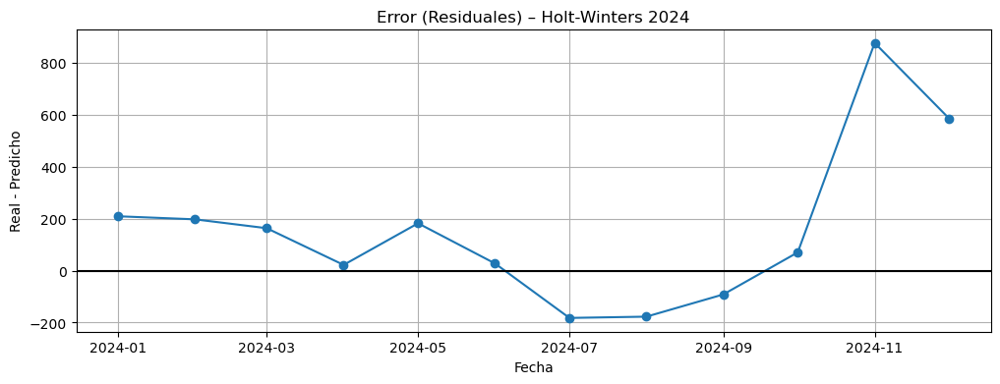

In [97]:
residuales = test - pred_test

plt.figure(figsize=(12,4))
plt.plot(residuales.index, residuales.values, marker='o')
plt.axhline(0, color='black')
plt.title('Error (Residuales) – Holt-Winters 2024')
plt.xlabel('Fecha')
plt.ylabel('Real - Predicho')
plt.grid(True)
plt.show()


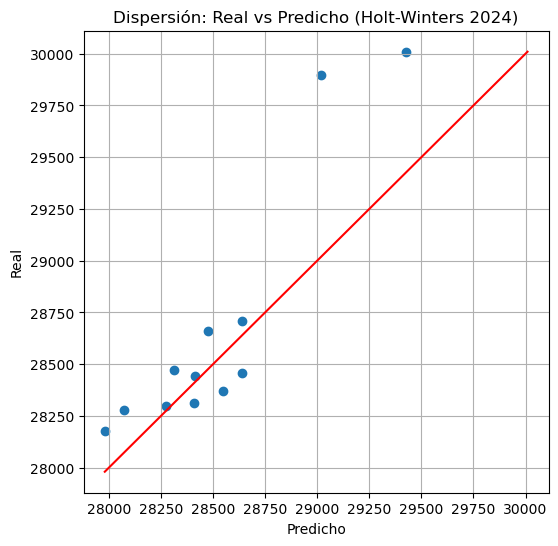

In [98]:
plt.figure(figsize=(6,6))
plt.scatter(pred_test.values, test.values)
min_val = min(test.min(), pred_test.min())
max_val = max(test.max(), pred_test.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red')  # línea ideal
plt.title('Dispersión: Real vs Predicho (Holt-Winters 2024)')
plt.xlabel('Predicho')
plt.ylabel('Real')
plt.grid(True)
plt.show()


In [99]:
# Reentrenar con toda la serie 2022–2024
hw_final = ExponentialSmoothing(
    serie,
    trend='add',
    seasonal='add',
    seasonal_periods=12
).fit()

# Predecir 12 meses de 2025
pred_2025 = hw_final.forecast(12)

# Asignar índice de fechas 2025
import pandas as pd
fechas_2025 = pd.date_range('2025-01-01', periods=12, freq='MS')
pred_2025.index = fechas_2025

print(pred_2025)


2025-01-01    29993.148994
2025-02-01    29953.281550
2025-03-01    30319.661761
2025-04-01    30286.842232
2025-05-01    30592.137845
2025-06-01    30517.472064
2025-07-01    30718.418101
2025-08-01    30679.745605
2025-09-01    30601.068192
2025-10-01    30902.779348
2025-11-01    31619.563081
2025-12-01    31921.777795
Freq: MS, dtype: float64


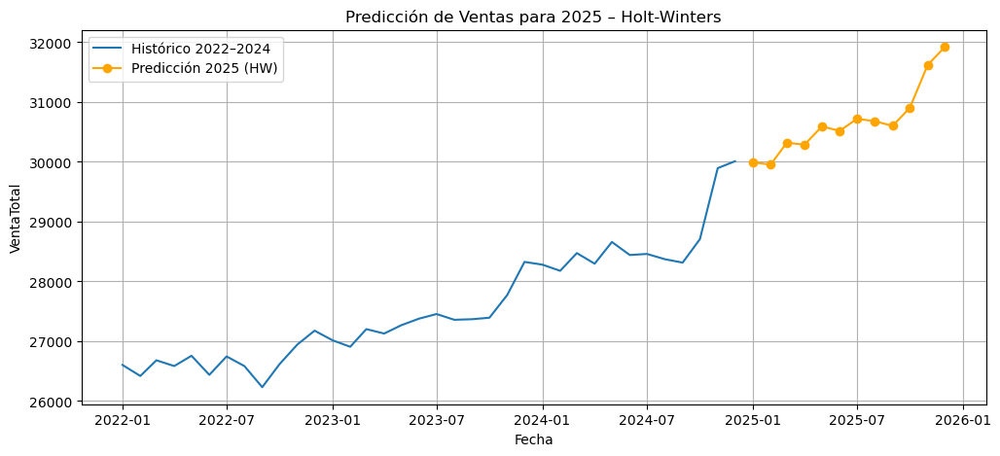

In [100]:
plt.figure(figsize=(12,5))
plt.plot(serie.index, serie.values, label='Histórico 2022–2024')
plt.plot(pred_2025.index, pred_2025.values, label='Predicción 2025 (HW)', color='orange', marker='o')
plt.title('Predicción de Ventas para 2025 – Holt-Winters')
plt.xlabel('Fecha')
plt.ylabel('VentaTotal')
plt.legend()
plt.grid(True)
plt.show()


In [101]:
df_pred_2025 = pd.DataFrame({
    'Fecha': pred_2025.index,
    'Prediccion_VentaTotal_2025': pred_2025.values
})

df_pred_2025


,Fecha,Prediccion_VentaTotal_2025
0,2025-01-01,29993.148994
1,2025-02-01,29953.281550
2,2025-03-01,30319.661761
3,2025-04-01,30286.842232
4,2025-05-01,30592.137845
5,2025-06-01,30517.472064
6,2025-07-01,30718.418101
7,2025-08-01,30679.745605
8,2025-09-01,30601.068192
9,2025-10-01,30902.779348


In [102]:
df_pred_2025.to_csv('Prediccion_Ventas_2025_HoltWinters.csv', index=False)


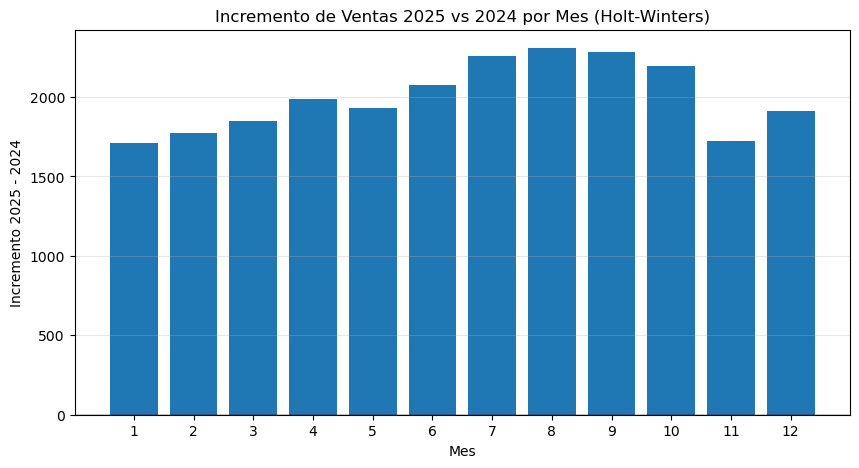

In [104]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Asegurar que tenemos las series correctas ---

# Real 2024 (de la serie original)
real_2024 = serie['2024-01-01':'2024-12-01']

# Predicción 2025 (Holt-Winters) ya calculada
# pred_2025: índice datetime 2025-01-01 ... 2025-12-01

# Crear DataFrame comparativo por mes
df_comp = pd.DataFrame({
    'Mes': real_2024.index.month,
    'Real_2024': real_2024.values,
    'Pred_2025': pred_2025.values
})
df_comp.set_index('Mes', inplace=True)

# Incremento esperado 2025 vs 2024
df_comp['Incremento'] = df_comp['Pred_2025'] - df_comp['Real_2024']

# --- Gráfico de barras ---

plt.figure(figsize=(10,5))
plt.bar(df_comp.index, df_comp['Incremento'])
plt.axhline(0, color='black', linewidth=1)

plt.title('Incremento de Ventas 2025 vs 2024 por Mes (Holt-Winters)')
plt.xlabel('Mes')
plt.ylabel('Incremento 2025 - 2024')

plt.xticks(df_comp.index)  # mostrar 1..12
plt.grid(axis='y', alpha=0.3)
plt.show()


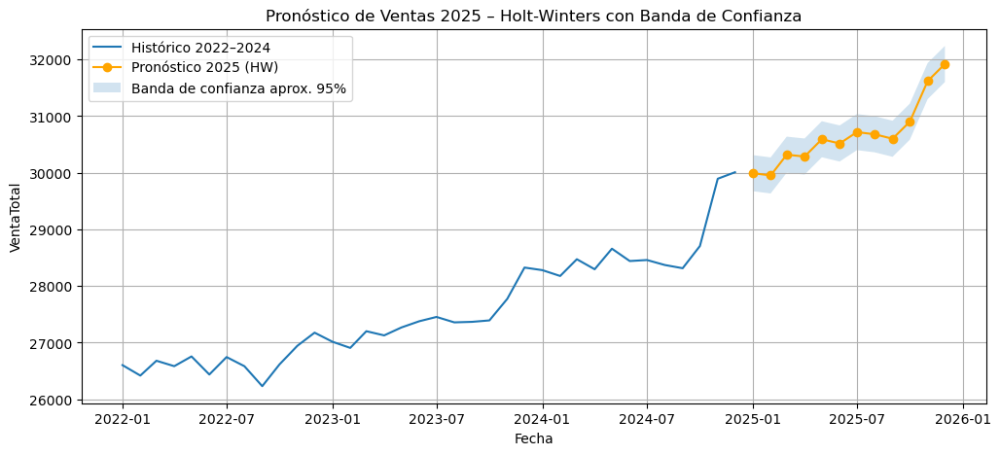

In [105]:
import numpy as np
import matplotlib.pyplot as plt

# --- Residuos del modelo en el periodo de entrenamiento ---
# (serie completa 2022-2024 menos el ajuste in-sample del modelo)

fitted_in_sample = hw_final.fittedvalues  # valores ajustados 2022-2024
residuos = serie - fitted_in_sample

# Desviación estándar de los residuos
sigma = residuos.std()

# Banda de confianza aproximada 95%: pred ± 1.96 * sigma
conf_low = pred_2025 - 1.96 * sigma
conf_high = pred_2025 + 1.96 * sigma

# --- Gráfico ---

plt.figure(figsize=(12,5))

# Histórico
plt.plot(serie.index, serie.values, label='Histórico 2022–2024')

# Pronóstico 2025
plt.plot(pred_2025.index, pred_2025.values,
         label='Pronóstico 2025 (HW)', color='orange', marker='o')

# Banda de confianza
plt.fill_between(pred_2025.index,
                 conf_low.values,
                 conf_high.values,
                 alpha=0.2,
                 label='Banda de confianza aprox. 95%')

plt.title('Pronóstico de Ventas 2025 – Holt-Winters con Banda de Confianza')
plt.xlabel('Fecha')
plt.ylabel('VentaTotal')
plt.legend()
plt.grid(True)
plt.show()


In [107]:
#Intervalos de Confianza
import pandas as pd
import numpy as np

# pred_2025  -> serie de predicción Holt-Winters 2025
# rmse       -> RMSE del modelo HW calculado en la parte de evaluación

# Cálculo de intervalos de confianza aproximados
ic_low = pred_2025 - 1.96 * rmse
ic_high = pred_2025 + 1.96 * rmse

# Crear DataFrame final
df_conf = pd.DataFrame({
    'Fecha': pred_2025.index,
    'Predicción_2025': pred_2025.values,
    'IC_95_Low': ic_low.values,
    'IC_95_High': ic_high.values
})

df_conf = df_conf.set_index('Fecha')

df_conf


,Predicción_2025,IC_95_Low,IC_95_High
Fecha,,,
2025-01-01,29993.148994,29340.774456,30645.523533
2025-02-01,29953.281550,29300.907011,30605.656089
2025-03-01,30319.661761,29667.287222,30972.036300
2025-04-01,30286.842232,29634.467693,30939.216771
2025-05-01,30592.137845,29939.763306,31244.512384
2025-06-01,30517.472064,29865.097526,31169.846603
2025-07-01,30718.418101,30066.043562,31370.792640
2025-08-01,30679.745605,30027.371067,31332.120144
2025-09-01,30601.068192,29948.693653,31253.442730


In [109]:
import pandas as pd

# df_conf = la tabla que ya generamos con:
# Fecha / Predicción_2025 / IC_95_Low / IC_95_High

# Exportar a CSV para Power BI
df_conf.to_csv("predicciones_2025_HW.csv", index=True)


## Conclusiones del proyecto

## 📌 Cómo se prepararon los datos

Se cargaron los datos históricos de ventas de 2022 a 2024.

Se convirtieron las fechas a formato datetime y se ordenaron cronológicamente.

Se agruparon las ventas por mes para obtener una serie mensual consistente.

Se verificó la frecuencia temporal y se rellenaron meses faltantes.

Se realizó un análisis exploratorio para identificar tendencia, variabilidad y posibles outliers.

Finalmente, la serie se dividió en:

Entrenamiento: 2022–2023

Prueba: 2024

## 📌 Qué modelo se usó y por qué

Se probaron varios modelos:

ARIMA(1,1,1) y ARIMA(0,1,1) → generaban pronósticos planos e inconsistentes.

Holt-Winters (Exponential Smoothing) con tendencia aditiva → produjo el mejor desempeño.

Razón principal:
La serie muestra una tendencia creciente, pero no presenta estacionalidad fuerte.
Holt-Winters con tendencia aditiva aprende mucho mejor los incrementos progresivos y se adapta mejor que ARIMA.

## 📌 Qué tan preciso fue el modelo

En la evaluación usando los datos reales de 2024, Holt-Winters obtuvo:

MAE ≈ 231

RMSE ≈ 332

R² ≈ 0.68

¿Cómo interpretar estos valores?

MAE = 231
En promedio, el modelo se equivoca por 231 unidades de venta por mes.
Para series cuyo valor ronda los ~28,000–30,000, este error es bastante bajo (~0.8%).

RMSE = 332
Indica que los errores grandes existen, pero no son extremos. Es aceptable.

R² = 0.68
El modelo explica alrededor del 68% de la variabilidad real.
Para una serie de ventas con ruido y sin estacionalidad fuerte, esto es bueno.

El modelo captura la tendencia general y la forma de la serie, aunque tiene leves dificultades con meses con cambios muy abruptos (lo cual es normal).

## 📌 Recomendaciones de uso del modelo para el área comercial

Usar el modelo como guía, no como valor exacto.
Las predicciones son consistentes, pero ninguna serie real es perfectamente predecible.

Interpretar las predicciones por tendencia.
→ El modelo indica una continuación del crecimiento observado desde 2023.
→ Útil para planeación de inventarios, compras y metas mensuales.

Reentrenar el modelo cada 3–6 meses.
Los patrones pueden cambiar si hay promociones, inflación o cambios internos.

Agregar nuevas variables en el futuro.
Ejemplos:

campañas

sucursales nuevas

precios promedio

indicadores económicos

Esto permitiría mejorar aún más la precisión.

No usar el modelo para decisiones críticas sin validar con expertos.
Las decisiones de alto impacto deben combinar modelado + experiencia operativa.